# CS576 Assignment #4: Visual Object Tracking
---
Primary TA : 
* Seongwoon Jo (seongwoongjo@kaist.ac.kr),
* Whie Jung (whieya@kaist.ac.kr), 
* Jinwoo Kim (jinwoo-kim@kaist.ac.kr)
---

## Instruction
- In this assignment, you will implement Visual Object Tracking model following the paper '[Fully-Convolutional Siamese Networks for Object Tracking](https://arxiv.org/pdf/1606.09549.pdf)'.


- To this end, you need to implement (1) gt_label processing, (2) architecture, (3) training/testing pipeline.

- In each part, you will be given a starter code for the implementation. Please read the instructions carefully to implement the codes.  

- <font color="red"> It takes at least 0.5 mins per epoch, so you need at least 0.5*150=75 mins for the whole training. </font> You may train the model longer. 

- For all problems, detailed guidelines are in [this slide](https://docs.google.com/presentation/d/1kGkks5tROFvYqtHYtxJRSoxJmMT97r9Ke6l4-umkXbM/edit?usp=sharing).


## Submission guidelines
- Your code and report will be all in Colab. 
- Go to the [link](https://drive.google.com/drive/folders/1NzpV70hXmKJ7wWgqLXvj63JcHSg9Nh81?usp=sharing), make a copy of `assignment4.ipynb`, `minidataset.tar` into your own google drive. Find the copies in your drive, recover their names to original ones if their names were changed to e.g. `Copy of assignment4.ipynb` or `assignment4.ipynb의 사본`. Also, keep them in a single directory.
- <font color="red"> You will get the full credit **only if** you complete the code **and** write a discussion of the results in the discussion section at the bottom of this page. Please refer to the discussion section for the details. </font> 
- Also, please write discussion in <font color="red"> ENGLISH, not in Korean. </font> 
- We should be able to reproduce your results using your code. Please double-check if your code runs without error and reproduces your results. Submissions failed to run or reproduce the results will get a substantial penalty. 

## Deliverables
- Your Colab notebook with name of **[StudentID].ipynb**
- Result videos(gifs) (`vid_0.gif`, `vid_1.gif`, ...). Please refer to the discussion section.
- Submit all of them in a format of **[StudentID].zip**.
- **If your submission doesn't contain all of the above deliverables , you will lose a point for deliverable (5pt).**
- Your assignment should be submitted through KLMS. All other submissions (e.g., via email) will not be considered as valid submissions.


## Due date
- **23:59:59 June 3rd.**
- Late submission is allowed until 23:59:59 June 5th.
- Late submission will be applied 20% penalty.

## Questions
- Please use [SLACK](https://join.slack.com/t/kaist-cs576-cvhq/shared_invite/zt-15g6flwkk-lEIIBYFg8N0VRPHOsxhVrA) as a main communication channel. Please **USE A PUBLIC CHANNEL INSTEAD OF DM** so that all students can share the information, unless there are critical issues in your code and cannot explain them without sharing it. Posting on the public channel leads to better chance of getting help from other students who are having similar issues.

## Plagiarism
- <font color="red"> Do not copy public codes or your classmate's code. We will strictly detect the plagiarism. All codes with plagiarism will be considered as 0 point.

## Changelog
-  

### Set the environments

In [ ]:
!pip install scipy==1.2.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 26.6 MB 1.4 MB/s 
  Attempting uninstall: scipy
    Found existing installation: scipy 1.4.1
    Uninstalling scipy-1.4.1:
      Successfully uninstalled scipy-1.4.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
jax 0.3.8 requires scipy>=1.2.1, but you have scipy 1.2.0 which is incompatible.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.


In [ ]:
from google.colab import drive
drive.mount('/gdrive')

Mounted at /gdrive


Below code unzips the dataset. Since the size of the dataset is quite large (we tried our best to minimize the size but still.. it's large), it would take some time (about 5~10 mins).

In [ ]:
# Specify the directory path where `assignemnt4.ipynb` exists.
# For example, if you saved `assignment4.ipynb` `/gdrive/My Drive/assignment4` directory,
# then set root = '/gdrive/My Drive/assignment4'
root = '/gdrive/My Drive/CS576_data/HW4'

!ln -s '/gdrive/My Drive'/{root.replace('/gdrive/My Drive/', '')} ./
!mkdir /minidataset
!tar -xf '/gdrive/My Drive'/{root.replace('/gdrive/My Drive/', '')}'/minidataset.tar' -C /minidataset

In [ ]:
import sys
sys.path.append(root)

import warnings
warnings.filterwarnings("ignore")

import json
from PIL import Image
from glob import glob
import random
from tqdm import tqdm 

from scipy.misc import imresize
import math

import os
import cv2
import numpy as np

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import transforms
from torch.utils.data import Dataset

### Helper functions


In [ ]:
def makedirs(path):
    if not os.path.exists(path):
        os.makedirs(path)

def read_annotations(json_path):
    '''
    Load annotations from XML file. 
    '''
    with open(json_path, 'r') as f:
        anno = json.load(f)

    return anno['bbox'], anno['W'], anno['H'], anno['valid']

In [ ]:
# Configurations
run_name = 'SiameseFC'                          # experiment name.
ckpt_root = os.path.join(root, 'checkpoints')   # from/to which directory to load/save checkpoints.
data_root = '/minidataset/minidataset'          # DO NOT CHANGE

device = 'cuda' if torch.cuda.is_available() else 'cpu'
lr = 1e-2           # learning rate
lr_final = 1e-5     # final learning rate
batch_size = 64     # batch_size
last_epoch = 0      # the last training epoch. (defulat: 0)
max_epoch = 150     # maximum epoch for the training.

### Problem 1. Define Dataset and DataLoader (10pt)
In this part, we define the custom dataset and the dataloader for ImageNet VID dataset. But don't worry, we provide almost all of the codes so the only part you should implmement is **generating the GT score map.**

In [ ]:
# Define ImageNet VID 
class ImageNetVID(Dataset):
    def __init__(self, dataset_path, transforms, max_frame_apart = 50, mode='train'):
        super(ImageNetVID, self).__init__()
        # args for loading dataset 
        self.dataset_path = dataset_path
        self.mode = mode
        self.transforms = transforms

        # args for preprocessing hyperparameters
        self.ex_size = 127
        self.srch_size = 255
        self.scoremap_size = 17
        self.threshold = 16.0
        self.stride = 8.0
        self.max_frame_apart = max_frame_apart

        # Load the dataset and preapre img_paths, bboxes. 
        self.load_vid_info(os.path.join(self.dataset_path, 'Data/VID', self.mode))

    def load_vid_info(self, data_dir):
        '''
        Given a dataset directoy, it loads all of the video paths and corresponding
        annotations. As a result, it initializes three parameters : 

            - self.img_paths (list): list of all image paths
            - self.bboxes (list): list of all xml paths (containing bounding box info)
            - self.validity (list): list of indicators which shows whether the image contains object.
        '''

        # load data, annotation paths for each frame. 
        all_img_paths, all_bboxes, all_valid_idx = [], [], []
        all_dirs = [p for p in sorted(glob(os.path.join(data_dir, '*/*')))]

        if self.mode == 'train':
            all_dirs = [p for p in sorted(glob(os.path.join(data_dir, '*/*')))]
        else:
            all_dirs = [p for p in sorted(glob(os.path.join(data_dir, '*')))]

        for i, d_dir in tqdm(enumerate(all_dirs)):
            # get image paths, bboxes for one video.
            img_paths, bboxes = [], []
            annot_dir = d_dir.replace('Data', 'Annotations')

            for img in sorted(os.listdir(d_dir)):
                # get image path, bboxe for each frame of the video
                annot_file = os.path.join(annot_dir, img.replace('.JPEG', '.json'))
                bbox, H, W, valid = read_annotations(annot_file)

                # TODO : Check validity
                if valid:
                    img_paths.append(os.path.join(d_dir, img))
                    bboxes.append(bbox)
                    all_valid_idx.append(i)

            # If a number of the valid frames in a video is less than 2, we cannnot
            # sample two distinct frames. So we skip it.  
            if len(img_paths) < 2:
                continue

            all_img_paths.append(img_paths)
            all_bboxes.append(bboxes)

        self.img_paths = all_img_paths
        self.bboxes = all_bboxes
        self.validity = all_valid_idx

    def prepare_labels(self):
        '''
        Here, we prepare a GT score map (GT label) for training the network. 
        Following modified version of the equation (6) presented in the slide, 
        define a GT label map of size (1, S, S), where S is a length of one 
        side of the (square) scoremap. Use k = self.stride and R = self.threshold. 
        It basically labels the each of the pixel either +1 (positive label) or
        0 (negative label). 

        Please note that you need to implent the slightly modifed version of 
        equation (6) in the paper to stabilize the training.
        For further details, please refer to the slide we provided : 
          (https://docs.google.com/presentation/d/1kGkks5tROFvYqtHYtxJRSoxJmMT97r9Ke6l4-umkXbM/edit?usp=sharing).

        Return
            label (numpy.ndarray) : GT scoremap of size (1, S, S) where S is a length of one side of the scoremap 
        '''
        ################# Problem 1 #################
        # Write your code here

        # ----- Process -----
        # (1) Define stride, radius, score map size, centre of score map, and label 
        # (2) Calculate score map of ground truth following as equation (6)

        # Define Variables 
        k = self.stride           # Output : 8
        R = self.threshold        # Output : 16
        S = self.scoremap_size    # Output : 17
        c = np.array([S/2, S/2])  # Output : (8.5, 8.5)

        # Define Target label (Ground truth label) 
        # label = np.zeros(shape=(1, S, S), dtype=np.uint8) # Output : [1, 17, 17]
        label = np.zeros(shape=(1, S, S)) # Output : [1, 17, 17]

        for grid_y in range(S):
          for grid_x in range(S):
            # Define u meaning of position in the score map
            u = np.array([grid_y, grid_x])

            # Generate ground truth score map following equation (6)
            if ((k * np.linalg.norm((u-c), ord=2)) <= R):
              label[0][grid_y][grid_x] = 1
            else:
              label[0][grid_y][grid_x] = 0
        #############################################

        return label

    def sample_pair(self, vid_idx):
        '''
        It randomly samples two frame indices of the given video. 

        Args
            vid_ids (int) : The index of video that we want to sample. 
        Return
            idx_exemplar_img (int) : index of exemplar frame within the video
            idx_search_img (int) : index of search frame within the video
        '''

        # Randomly choose exempler image index for the given video.
        num_frames = len(self.img_paths[vid_idx])
        idx_examplar_img = random.randint(0, num_frames-1)

        # Randomly choose search image index that is far apart from example image smaller than self.max_frame_apart
        max_idx = min(num_frames-1, idx_examplar_img + self.max_frame_apart)
        min_idx = max(0, idx_examplar_img - self.max_frame_apart)
        idx_search_img = random.randint(min_idx, max_idx)

        return idx_examplar_img, idx_search_img

    def compute_square_size(self, h, w):
        '''
        It computes the length of the each side of the square that preserves 
        the area of (h + context margin) x (w + context margin) rectangle.

        Args
            h, w (int) : height & width of the rectangle
        Return
            square_size (int) : length of the side of the transformed square.
        '''

        # We first add context margins on each side. 
        # But the height and width of the bounding box(rectangle) can be different,
        # we calculate the side of the square box, while preserving the area of the rectangle.
        context_margin = (h + w)/4
        square_size = int(math.sqrt((w + 2*context_margin) * (h + 2*context_margin)))
        return square_size

    def crop_n_resize(self, img, center, square_size, target_size):
        '''
        It transforms the input img to match the size of target_size.
        To this end, it first considers the bounding box (given with a center point 
        and a length of each side) and crop from the given image. If the bounding box
        goes beyong the image, we pad it with mean RGB values. Then, we resize the image
        to become a sqaure image having each side of target_size length.

        Args
            img (numpy.ndarray) : Given image
            center (tuple) : Center point of the bounding box
            square_size (int): Length of the (square) bounding box
            target_size (int) : Length of the each side of the target image
        Return
            img_final (numpy.ndarray) : final cropped/resized image
        '''
                
        H, W, _ = img.shape
        pads = [0, 0, 0, 0]

        # First crop the image
        offset = square_size//2
        x1 = int(center[0] - offset)
        x2 = int(center[0] + offset)
        y1 = int(center[1] - offset)
        y2 = int(center[1] + offset)

        if x1 < 0:
            pads[0] = int(- x1)
            x1 = int(0)
        if x2 > W-1:
            pads[1] = int(x2 - (W-1))
            x2 = int(W-1)
        if y1 < 0:
            pads[2] = int(-y1)
            y1 = int(0)
        if y2 > H-1 :
            pads[3] = int(y2 - (H-1))
            y2 = int(H-1)

        cropped_img = img[y1:y2+1, x1:x2+1, :]

        # pad with mean rgb values
        mean_rgb = np.mean(cropped_img)
        cropped_img = np.pad(cropped_img, ((pads[3], pads[2]), (pads[0], pads[1]), (0,0)), 'constant', constant_values=mean_rgb)

        # Resize the image to match the target_size
        img_final = imresize(cropped_img, (target_size, target_size), interp='bilinear')
        return img_final

    def prepare_samples(self, vid_idx):
        '''
        It randomly samples two frames for a given video and preprocesses them 
        to make the bounding box centered in the image.

        Args
            vid_idx (int) : video index
        Return 
            ex_img_final (Tensor) : preprocessed exemplar image
            srch_img_final (Tensor) : preprocessed final image
        '''
        
        # randomly sample two frames in the video
        ex_idx, srch_idx = self.sample_pair(vid_idx)

        # read images
        ex_img = Image.open(self.img_paths[vid_idx][ex_idx])
        srch_img = Image.open(self.img_paths[vid_idx][srch_idx])
        ex_img = np.asarray(ex_img)
        srch_img = np.asarray(srch_img)

        # get annotations
        ex_bbox = self.bboxes[vid_idx][ex_idx]
        srch_bbox = self.bboxes[vid_idx][srch_idx]

        w_ex = ex_bbox['xmax']-ex_bbox['xmin']
        h_ex = ex_bbox['ymax']-ex_bbox['ymin']
        cnt_ex = ((ex_bbox['xmax']+ex_bbox['xmin'])/2, (ex_bbox['ymax']+ex_bbox['ymin'])/2) 

        w_srch = srch_bbox['xmax']-srch_bbox['xmin']
        h_srch = srch_bbox['ymax']-srch_bbox['ymin']
        cnt_srch = ((srch_bbox['xmax']+srch_bbox['xmin'])/2, (srch_bbox['ymax']+srch_bbox['ymin'])/2) 

        # A bit different from the original paper.
        # To make a square image, we first 
        ex_square_size = self.compute_square_size(h_ex, w_ex)
        srch_square_size = ex_square_size * self.srch_size / self.ex_size

        # crop/resize the image 
        ex_img_final = self.crop_n_resize(ex_img, cnt_ex, ex_square_size, self.ex_size)
        srch_img_final = self.crop_n_resize(srch_img, cnt_srch, srch_square_size, self.srch_size)

        # apply transforms
        ex_img_final = self.transforms(ex_img_final)
        srch_img_final = self.transforms(srch_img_final)

        return ex_img_final, srch_img_final

    def __getitem__(self, idx):
        if self.mode == 'train' or self.mode == 'val' :
            ex_img_final, srch_img_final = self.prepare_samples(idx)
            label = self.prepare_labels()             
            return ex_img_final, srch_img_final, label

    def __len__(self):
        return len(self.img_paths)

In [ ]:
# ImageNet VID for test samples.
class TestVIDSet(ImageNetVID):

    def __init__(self, dataset_path, transforms, max_frame_apart = 50, mode='train'):
        super(TestVIDSet, self).__init__(dataset_path, transforms, max_frame_apart, mode)
    
    def __getitem__(self, vid_idx):
        # sample two frames in the video
        # read images
        ex_img = Image.open(self.img_paths[vid_idx][0])
        ex_img = np.asarray(ex_img)
        
        srch_vid = []
        for i in range(len(self.img_paths[vid_idx])):
            srch_img = (Image.open(self.img_paths[vid_idx][i]))
            srch_vid.append(np.asarray(srch_img))
        orig_size = srch_vid[0].shape
        
        srch_vid = np.stack(srch_vid)

        # get annotations
        ex_bbox = self.bboxes[vid_idx][0]

        w_ex = ex_bbox['xmax']-ex_bbox['xmin']
        h_ex = ex_bbox['ymax']-ex_bbox['ymin']
        cnt_ex = ((ex_bbox['xmax']+ex_bbox['xmin'])/2, (ex_bbox['ymax']+ex_bbox['ymin'])/2) 

        # A bit different from the original paper.
        # To make a square image, we first 
        ex_square_size = self.compute_square_size(h_ex, w_ex)

        # crop/resize the image 
        ex_img_final = self.crop_n_resize(ex_img, cnt_ex, ex_square_size, self.ex_size)
        
        # resize and pad
        srch_vid_final = []
        for frame in srch_vid:
            H, W, _ = frame.shape
            if H < W:
                frame = np.pad(frame, (((W-H)//2, (W-H)//2), (0, 0), (0, 0)), 'constant', constant_values=frame.mean())
            else:
                frame = np.pad(frame, ((0, 0), ((H-W)//2, (H-W)//2), (0, 0)), 'constant', constant_values=frame.mean())
                
            frame = imresize(frame, (self.srch_size, self.srch_size), interp='bilinear')
            srch_vid_final.append(frame)
        final_size = srch_vid[0].shape
        
        srch_vid_final = np.stack(srch_vid_final)
        
        srch_scale = max(final_size) / max(orig_size)
        ex_scale = self.ex_size / float(ex_square_size//2*2)
        
        bbox = self.bboxes[vid_idx][0]
        orig_w = bbox['xmax'] - bbox['xmin']
        orig_h = bbox['ymax'] - bbox['ymin']
        
        w = orig_w * ex_scale / srch_scale
        h = orig_h * ex_scale / srch_scale

        return ex_img_final, srch_vid_final, (w, h)

In [ ]:
# Define the dataloader
to_tensor = transforms.ToTensor()
VID_train = ImageNetVID(data_root, to_tensor, 50, 'train')
VID_val = ImageNetVID(data_root, to_tensor, 50, 'val')
VID_test = TestVIDSet(data_root, to_tensor, 50, 'val')
train_loader = DataLoader(VID_train, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(VID_val, batch_size=batch_size, shuffle=False)

1952it [00:14, 132.62it/s]
281it [00:01, 156.24it/s]
281it [00:01, 167.14it/s]


### Problem 2. Define the Models

#### Implement Embedding Network (20pt)
We will use AlexNet for embedding network following the original paper.

In [ ]:
class AlexNet(nn.Module):
    '''
    We use AlexNet for the embedding network. The embedding network forwards 
    both exemplar images and search images to get embedding features. 
    Then, compute cross correlation between those two features to get a final score map. 
    # Please refer this (https://docs.google.com/presentation/d/1kGkks5tROFvYqtHYtxJRSoxJmMT97r9Ke6l4-umkXbM/edit?usp=sharing).
    '''
    def __init__(self):
        super(AlexNet, self).__init__()

        ################# Problem 2.1 #################
        # Write your code here

        # Make AlexNet backbone network for encoding image representation !
        # ----- Define Eleven layers !!! -----
        # 1) Conv2d_1: in_channels 3  , out_channels 96 , kernel_size 11, stride 2, padding 0, groups 1
        # 2) Conv2d_2: in_channels 96 , out_channels 256, kernel_size 5 , stride 1, padding 0, groups 2
        # 3) Conv2d_3: in_channels 256, out_channels 384, kernel_size 3 , stride 1, padding 0, groups 1
        # 4) Conv2d_4: in_channels 384, out_channels 384, kernel_size 3 , stride 1, padding 0, groups 2
        # 5) Conv2d_5: in_channels 384, out_channels 256, kernel_size 3 , stride 1, padding 0, groups 2
        # 6) BatchNorm2d_1: num_features 96
        # 7) BatchNorm2d_2: num_features 256
        # 8) BatchNorm2d_3: num_features 384
        # 9) BatchNorm2d_4: num_features 384
        # 10) ReLU: inplace=True
        # 11) MaxPooling: kernel_size 3, stride 2, padding 0

        self.conv1 = nn.Conv2d(in_channels=3,   out_channels=96,  kernel_size=11, stride=2, padding=0, groups=1) 
        self.conv2 = nn.Conv2d(in_channels=96,  out_channels=256, kernel_size=5,  stride=1, padding=0, groups=2)
        self.conv3 = nn.Conv2d(in_channels=256, out_channels=384, kernel_size=3,  stride=1, padding=0, groups=1)
        self.conv4 = nn.Conv2d(in_channels=384, out_channels=384, kernel_size=3,  stride=1, padding=0, groups=2)
        self.conv5 = nn.Conv2d(in_channels=384, out_channels=256, kernel_size=3,  stride=1, padding=0, groups=2)
        self.bn1 = nn.BatchNorm2d(num_features=96)
        self.bn2 = nn.BatchNorm2d(num_features=256)
        self.bn3 = nn.BatchNorm2d(num_features=384)
        self.bn4 = nn.BatchNorm2d(num_features=384)
        self.act = nn.ReLU(inplace=True)
        self.pool = nn.MaxPool2d(kernel_size=3, stride=2, padding=0)
        ###############################################

    def forward(self, x):

        ################# Problem 2.2 #################
        # Write your code here

        # ----- Process -----
        # Conv1 -> BatchNorm1 -> ReLU -> Pool1 -> Conv2 -> BatchNorm2 -> ReLU -> Pool2 ->  
        #          Conv3 -> BatchNorm3 -> ReLU -> Conv4 -> BatchNorm4 -> ReLU -> Conv5

        output = self.conv1(x)          # Conv1
        output = self.bn1(output)       # BatchNorm1
        output = self.act(output)       # ReLU
        output = self.pool(output)      # Pool1        
        output = self.conv2(output)     # Conv2
        output = self.bn2(output)       # BatchNorm2
        output = self.act(output)       # ReLU
        output = self.pool(output)      # Pool2        
        output = self.conv3(output)     # Conv3
        output = self.bn3(output)       # BatchNorm3
        output = self.act(output)       # ReLU       
        output = self.conv4(output)     # Conv4
        output = self.bn4(output)       # BatchNorm4
        output = self.act(output)       # ReLU        
        output = self.conv5(output)     # Conv5
        ###############################################
        return output    

#### Implement Siamese Network (20pt)
Using the embedding network we implemented above, we will construct the Siamese Network to compute cross correlation between exemplar image and search image.

In [ ]:
class SiameseNet(nn.Module):
    '''
        For given embedding network (fully convolutional network, fcn), it 
        forwards both exemplar images and search images to get embedding 
        features. Then, compute cross correlation between those two features 
        to get a final score map. 
    '''
    def __init__(self, fcn):
        super(SiameseNet, self).__init__()
        self.fcn = fcn
        self.bias = nn.Parameter(torch.zeros(1))
        self.apply(self.weight_init)

    def compute_cross_corr(self, feat_z, feat_x):
        '''
        Given two convolutional feature map (embedding features) feat_z and 
        feat_x, you should compute cross correlation between them following 
        the equation (2) in the paper. 

        # For further details. please refer to the slide :
         (https://docs.google.com/presentation/d/1kGkks5tROFvYqtHYtxJRSoxJmMT97r9Ke6l4-umkXbM/edit?usp=sharing).

        (Hint : use F.conv2d() function )

        Args:
            z (Tensor) : exemplar image of size [B, C, H1, W1]
            x (Tensor) : search image of size [B, C, H2, W2]
        Return:
            scoremap (Tensor) : Final scoremap of size [B, 1, H, W]
        '''

        ################# Problem 2.3 #################
        # Write your code here

        # ----- Difference between nn.Conv2d and nn.functional.conv2d ------
        # (1) nn.Conv2d: Weights are not declared directly.
        #     -> nn.Conv2d(in_channels, out_channels, kernel_size)

        # (2) nn.functional.conv2d: Declare weights directly (using externally created filters).
        #     -> nn.functional.conv2d(input, weight, bias, stride, padding, groups)
        #         -> input shape:  [minibatch,    in_channels,        iH, iW]   
        #         -> weight shape: [out_channels, in_channels/groups, kH, kW]
        #         -> bias shape:   out_channels
        #         -> return shape: same as weight shape !!!
        #     -> if you use nn.functional.conv2d, then you also define filter to convolution operation !!
        
        # ----- Definition -----
        # feat_z: target given at initial frame -> like filter same as weight & shape [B, 128, 6, 6]
        # feat_x: image given at current frame  -> same as input & shape [B, 128, 22, 22]

        # ----- Process -----
        # (1) Reshape feat_z and feat_x following above input and weight in nn.functional.conv2d respectively !!
        # (2) Compute cross corrleation using F.cond2d function !!

        # Define scale_down value, batch size, input channel, input width, and input height
        scaled_down = 1e-3

        B = feat_x.size(dim=0)     # Output : B
        C = feat_x.size(dim=1)     # Output : C  = 128
        x_H = feat_x.size(dim=2)   # Output : iH = 22
        x_W = feat_x.size(dim=3)   # Output : iW = 22

        reshape_feat_x = torch.reshape(feat_x, (1,B * C, x_H, x_W)) # Output : torch.size([1, B * C, 22, 22])

        # Compute Cross Correlation  
        scoremap = (scaled_down * F.conv2d(reshape_feat_x, feat_z, groups=B).permute(1, 0, 2, 3)) + self.bias
        ###############################################

        return scoremap

    def forward(self, z, x):
        '''
        It forwards exemplar image z and search image x to get embedding 
        features followed by cross correlation computation between them to 
        return a score map. To compute a cross correlation, use 
        self.compute_cross_corr() you implemented above. 
        
        Args:
            z (Tensor) : exemplar image of size [B, C, H1, W1]
            x (Tensor) : target image of size [B, C, H2, W2]
        Return:
            scoremap (Tensor) : Final scoremap of size [B, 1, H, W]
        '''
        ################# Problem 2.4 #################
        # Write your code here

        # ----- Process -----
        # (1) Pass the FCN layers; already defined AlexNet 
        #       -> Go through same FCN layers all x and z
        # (2) Compute cross correlation compute_cross_corr() function using passed x and z

        feat_x = self.fcn(x) # Output : torch.size([B, 128, 22, 22])
        feat_z = self.fcn(z) # Output : torch.size([B, 128, 6, 6])
        scoremap = self.compute_cross_corr(feat_z, feat_x) # Output : torch.size([B, 1, 17, 17])
        ###############################################     

        return scoremap

    def weight_init(self, m):
        if isinstance(m, nn.Linear) or isinstance(m, nn.Conv2d):
            torch.nn.init.xavier_normal_(m.weight)
            torch.nn.init.constant_(m.bias, 0)
        elif isinstance(m, nn.BatchNorm2d):
            torch.nn.init.constant_(m.weight, 1)
            torch.nn.init.constant_(m.bias, 0)

In [ ]:
# Define model and optimizer
embedding_net = AlexNet().to(device)
model = SiameseNet(embedding_net).to(device)

# Define Optimizer
optimizer = optim.SGD(model.parameters(), lr=lr)

### Problem 3. Implement the training pipeline (50pt)
So far, we have provided basic skeleton codes for training pipeline in previous assignments. But in this assignment, you will implement the whole pipleline by yourself. 

In [ ]:
from tqdm.notebook import tqdm as tqdm2
from tqdm import tqdm
from torch.utils.tensorboard import SummaryWriter
from pathlib import Path
import datetime
import time


'''
Things that you should implements are following. 

(P3-1) Checkpointing (10pt)
  - (1) You should save the checkpoint('last.pth') after every epoch ends.
  - (2) You should update the checkpoint('best.pth') if current model has lower 
    validation loss compared to that of previous best model, after every epoch ends.
  - The checkpoint must contain model's parameters, optimizer's parameters, 
    current epoch, current train loss, current validation loss.

(P3-2) Training pipeline (10pt)
  - You should implement training loop that iterates for 'max_epoch' times. 
  - In each iteration, sample batches (which includes a triplet of exemplar image, 
    search image, GT score map. Please refer to the Dataset above) using 
    predefined 'train_loader'. 
  - For the given triplet, feed data into the model to compute predicted 
    scoremap and compute the loss. 
  - For the loss function, please use Binary Cross Entropy Loss (BCEWithLogitsLoss). 
    - Please refer this (https://docs.google.com/presentation/d/1kGkks5tROFvYqtHYtxJRSoxJmMT97r9Ke6l4-umkXbM/edit?usp=sharing).
  - Also don't forget to update your model.

(P3-3) Validation pipeline (10pt)
  - If we only check the training loss, we cannot know whether the model is overfitting
    or not (ie, specialized to current training dataset and cannot solve the task on 
    general data). So you should implement 
  - After one epoch ends, measure the validation loss using val_loader similar 
    to the training process. 

(P3-4) Printing average training loss and validation loss after one epoch (10pt)
  - For the quick assessment of current training progress, print the (1) average
    training loss and (2) average vaildation loss, after one epoch ends.  

(P3-5) Tensorboard Logging (10pt)
  - Tensorboard is a great tool for analyzing the training process.
  - You need to implement tensorboard logging. You should log (1) average 
    training loss and (2) average validation loss on the tensorboard, after every
    epoch ends.  
  - You may refer to the previous assignments to see how it works.

(Hint) The overall framework may look like this : 

for epoch in range(1, max_epoch):
    for batch in train_loader: 
        # feed training data into the model and compute loss.
        # update the model

    for batch in val_loader: 
        # feed validation data into the model and compute loss.

    # print average training loss and validation loss
    # log those two losses into the tensorboard 

    # save current training status as 'last.pth'
    # If current validation loss is less than best validation loss so far, 
      then save current training status as 'best.pth'
'''
############################## Problem 3 ###############################
# Write your code here

# Setup Tensorboard
log_dir = os.path.join(root, 'tensorboard')

writer = SummaryWriter(log_dir)
%load_ext tensorboard
%tensorboard --logdir '/gdrive/My Drive/'{str(log_dir).replace('/gdrive/My Drive/', '')}

model = model.to(device)

# To see overall time and loss
best_val_loss = 100
overall_time = time.time()

for epoch in range(1, max_epoch):
  # Learning rate scheduling
  if epoch in [50, 150]:
      lr *= 0.1

      if lr <= lr_final:
        lr = lr_final

      for param_group in optimizer.param_groups:
          param_group['lr'] = lr

  if epoch < last_epoch:
      continue

  model.train()
  
  # To see time for train
  start_time = time.time()

  # To see train loss 
  train_loss = 0.
  train_num_data = 0.

  # feed training data into the model and compute loss.
  # update the model
  for target, input, label in train_loader:
    # Set proper device for the target (z) / input (x) / label (label)
    target = target.to(device)
    input = input.to(device)
    label = label.to(device)

    # Feed target and input into the network, get scoremap
    scoremap = model(target, input)

    # Compute loss using scoremap and label; loss function is same as BCELoss (Binary Class)
    criterion = nn.BCEWithLogitsLoss()
    loss = criterion(scoremap, label)
    
    # Get average validation loss
    train_loss += loss.item() 
    train_num_data += 1

    # Flush out the previously computed gradient
    optimizer.zero_grad()

    # Backward the computed loss 
    loss.backward()
    
    # Update network weights
    optimizer.step()

  # Compute average validation loss using validation data number
  train_loss /= float(train_num_data)

  # To see train loss and time 
  train_duration = time.time() - start_time
  print(f'Epoch {epoch}/{max_epoch} || train loss={train_loss:.4f} time={train_duration:.3f} secs')

  # To see time for validation
  _start_time = time.time()
      
  model.eval()
  with torch.no_grad():
    # To see validation loss 
    val_loss = 0.
    val_num_data = 0.

    for target, input, label in val_loader: 
      # Set proper device for the target (z) / input (x) / label (label)
      target = target.to(device)
      input = input.to(device)
      label = label.to(device)

      # Feed target and input into the network, get scoremap
      scoremap = model(target, input)

      # Compute loss using scoremap and label; loss function is same as BCELoss (Binary Class)
      criterion = nn.BCEWithLogitsLoss()
      loss = criterion(scoremap, label)

      # Get average validation loss
      val_loss += loss.item() 
      val_num_data += 1

    # Compute average validation loss using validation data number
    val_loss /= float(val_num_data)

    # Update the best model('best.pth') if current model has lower validation loss than previous best model.
    if (best_val_loss > val_loss):
      best_val_loss = val_loss
      # Save checkpoint contained model's parameters, optimizer's parameters, current epoch, current train loss, current validation loss.
      ckpt_best = {'model':model.state_dict(),
                   'optimizer':optimizer.state_dict(),
                   'epoch':epoch,
                   'train_loss':train_loss,
                    'val_loss':val_loss} 
      torch.save(ckpt_best, os.path.join(ckpt_root, 'best.pth'))

  # Save the checkpoint('last.pth') after every epoch ends.
  ckpt = {'model':model.state_dict(),
          'optimizer':optimizer.state_dict(),
          'epoch':epoch,
          'train_loss':train_loss,
          'val_loss':val_loss} 
  torch.save(ckpt, os.path.join(ckpt_root, 'last.pth'))

  # Log train loss and validation loss using tensorboard
  if writer is not None: 
    writer.add_scalar('train_loss', train_loss, epoch)
    writer.add_scalar('validation_loss', val_loss, epoch)

  # To see validation loss and time 
  val_duration = time.time() - _start_time
  print(f'Epoch {epoch}/{max_epoch} || val loss={val_loss:.4f} time={val_duration:.3f} secs')

# [Option] To see final loss and time 
total_t = time.time() - overall_time 
print(f'Final best validation loss : {best_val_loss:.4f} total time={total_t:.3f} secs')
##########################################################################

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

Epoch 1/150 || train loss=0.8135 time=33.495 secs
Epoch 1/150 || val loss=0.6795 time=7.346 secs
Epoch 2/150 || train loss=0.6176 time=33.458 secs
Epoch 2/150 || val loss=0.6024 time=4.320 secs
Epoch 3/150 || train loss=0.5601 time=31.924 secs
Epoch 3/150 || val loss=0.5400 time=4.380 secs
Epoch 4/150 || train loss=0.5141 time=32.307 secs
Epoch 4/150 || val loss=0.4956 time=4.348 secs
Epoch 5/150 || train loss=0.4758 time=31.266 secs
Epoch 5/150 || val loss=0.4823 time=4.530 secs
Epoch 6/150 || train loss=0.4434 time=32.249 secs
Epoch 6/150 || val loss=0.4314 time=4.436 secs
Epoch 7/150 || train loss=0.4154 time=30.877 secs
Epoch 7/150 || val loss=0.4058 time=4.404 secs
Epoch 8/150 || train loss=0.3909 time=30.712 secs
Epoch 8/150 || val loss=0.3831 time=4.399 secs
Epoch 9/150 || train loss=0.3700 time=30.455 secs
Epoch 9/150 || val loss=0.3648 time=4.310 secs
Epoch 10/150 || train loss=0.3516 time=32.861 secs
Epoch 10/150 || val loss=0.3442 time=4.324 secs
Epoch 11/150 || train loss=0

### Visualization
After the training is done, you can check the tracking result with this visualization code.

In [ ]:
# First install a module for generating gif later.
!apt-get install imagemagick

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'apt autoremove' to remove it.
The following additional packages will be installed:
  fonts-droid-fallback fonts-noto-mono ghostscript gsfonts
  imagemagick-6-common imagemagick-6.q16 libcupsfilters1 libcupsimage2
  libdjvulibre-text libdjvulibre21 libgs9 libgs9-common libijs-0.35
  libjbig2dec0 liblqr-1-0 libmagickcore-6.q16-3 libmagickcore-6.q16-3-extra
  libmagickwand-6.q16-3 libnetpbm10 libwmf0.2-7 netpbm poppler-data
Suggested packages:
  fonts-noto ghostscript-x imagemagick-doc autotrace cups-bsd | lpr | lprng
  enscript gimp gnuplot grads hp2xx html2ps libwmf-bin mplayer povray radiance
  sane-utils texlive-base-bin transfig ufraw-batch inkscape libjxr-tools
  libwmf0.2-7-gtk poppler-utils fonts-japanese-mincho | fonts-ipafont-mincho
  fonts-japanese-gothic | fonts-ipafont-gothic fo

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

def draw(exemplar, search, score_map, box_size, idx=0, vis=True, save=False):
    # search: [# of frames, 3, H, W]
    # box_size: (w, h)
    assert vis or save

    if save:
        save_dir = os.path.join(root, 'results', str(idx))
        makedirs(save_dir)
        plt.imshow(exemplar[0].permute(1,2,0).cpu())
        plt.savefig(os.path.join(save_dir, 'exemplar.png'))
        plt.show()

    for i, img in enumerate(search):
        
        center_points = (score_map[i,0]==score_map[i,0].max()).nonzero()[0].detach().cpu()
            
        fig, ax = plt.subplots()
        ax.axis('off')

        # Plot the frame
        ax.imshow(img)

        # Draw rectangle
        ax.scatter(x=center_points[1], y=center_points[0], marker='P', c='r', s=100)
        ax.imshow(score_map[i].squeeze(0).cpu(), cmap='jet', alpha=0.25)

        # Save or show each frame.
        if save:
            plt.savefig(os.path.join(save_dir, f'frame_{i:03d}.png'))        
        if vis:
            plt.show()

    return

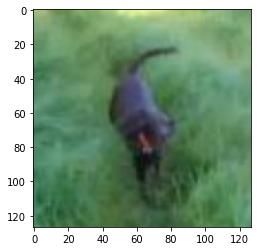

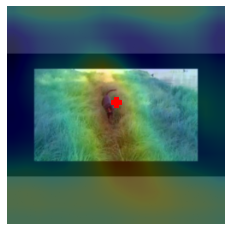

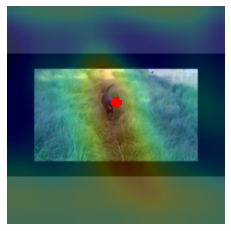

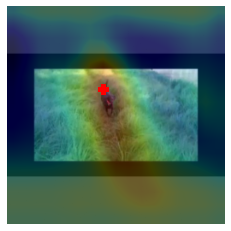

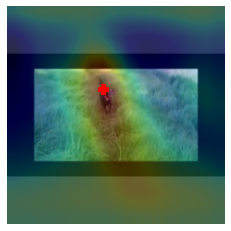

...

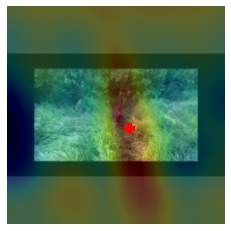

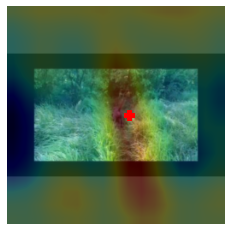

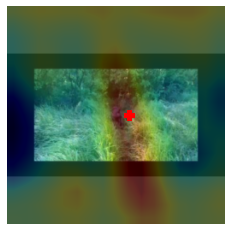

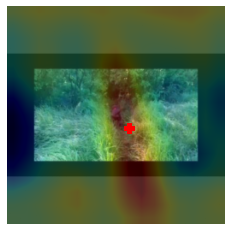

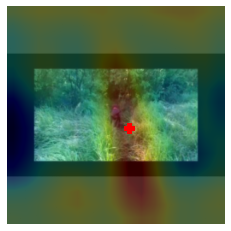

/gdrive/My Drive/CS576_data/HW4/results/250
Creating gif...
Completed making gif! You can find it in /gdrive/MyDrive/CS576_data/HW4/results/250/../vid_250.gif


In [ ]:
# Visualizer
# You may modify the idx.
# Recommendation for the idx = 0, 16, 20, 30, 40, 115, 140, 250, 
# Those are the videos that contains a proper exemplar and single target in each frame. 
idx = 250

with torch.no_grad():
    # exemplar: exemplar image with shape [3, 127, 127]
    # search  : search Video with shape [# of frames, 3, 255, 255]
    # size of bounding box (w, h)
    exemplar, search, (w, h) = VID_test[idx]
    exemplar = to_tensor(exemplar).to(device)
    vid = []
    for frame in search:
        vid.append(to_tensor(frame).to(device))
    vid = torch.stack(vid)
    search = vid
    
    # For all frames, use an exemplar of the first frame.
    batch_size = search.shape[0]
    exemplar = exemplar.unsqueeze(0).repeat(batch_size, 1, 1, 1)
    
    # Get score_map from SiameseFC
    score_map = model(exemplar, search)
    
    # Size up the score_map
    score_map = F.interpolate(score_map, search.shape[-2:], mode='bilinear')

    # Run Argmax over 2 dimension.
#     center_points = (score_map==score_map.max(-1, keepdim=True)[0].max(-2, keepdim=True)[0]).nonzero()[:, -2:]
    
#     center_points = (score_map[i][0]==score_map[i][0].max()).nonzero()
#     print(center_points.shape)
    # Draw box.
    draw(exemplar, search.detach().cpu().permute(0,2,3,1), score_map, (h, w), idx=idx, vis=True, save=True)
    
    
# Make a resulting gif file
print(os.path.join(root, 'results', str(idx)))
print('Creating gif...')
save_dir = os.path.join(root, 'results', str(idx))
gif_dir = save_dir.replace('My Drive', 'MyDrive')
!convert -delay 20 -loop 1 {gif_dir}/frame*.png {gif_dir}/../vid_{idx}.gif
print(f'Completed making gif! You can find it in {gif_dir}/../vid_{idx}.gif')

### P4. Discussion (10pt)
In this section, you should summarize your results with your analysis on them. You don't need to conduct your own experiments this time. Instead, provide a disucssion on SiamFC. At least, your discussion must include following items.
* Provide at least 3 gifs from 3 different videos (`vid_1.gif`, `vid_2.gif`, ...) and brief analysis on them (If it's working well, discuss the key to the success. If it's not working properly, discuss the possible reasons for the failure.) 
* Provide your own thoughts on the limitation of this work and provide a possible direction for improvement.

---
# **Results**
---
---
* **idx = 0**

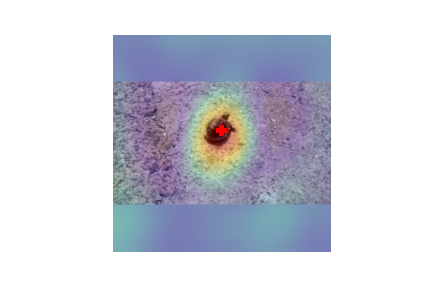
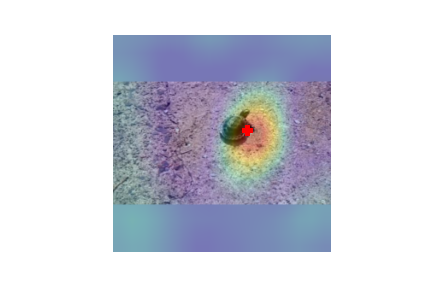

---
* **idx = 16**

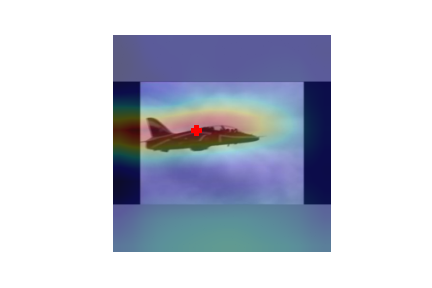
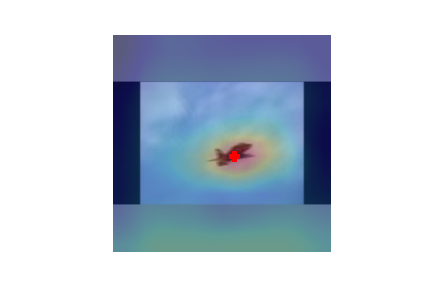

---
* **idx = 20**

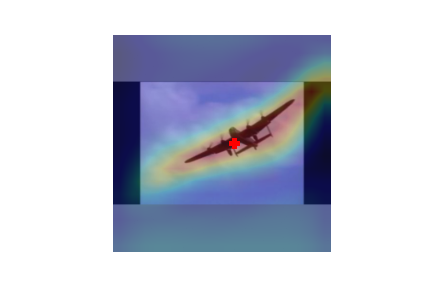
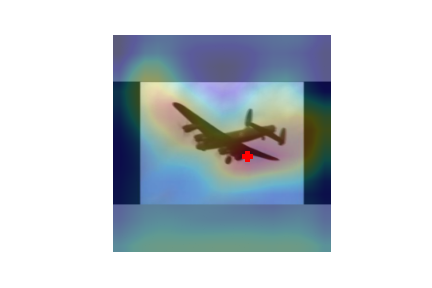

---
* **idx = 30**

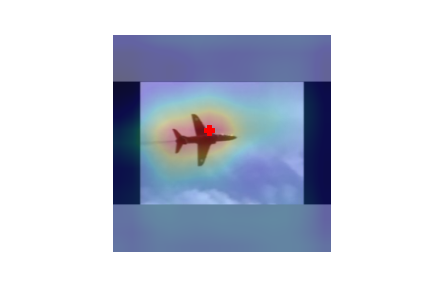
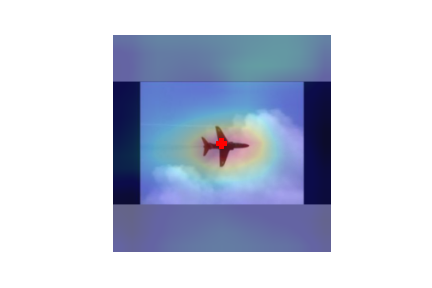

---
* **idx = 40**

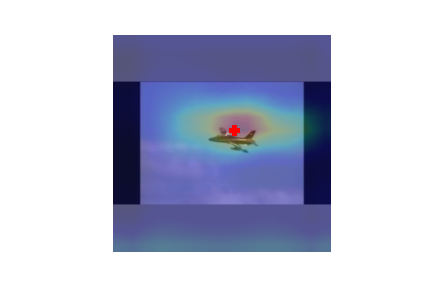
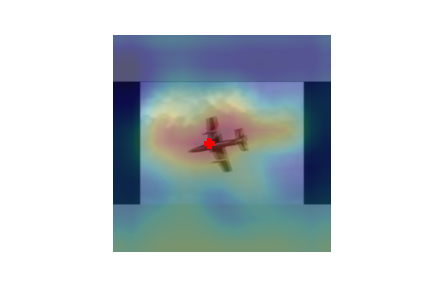

---
* **idx = 115**

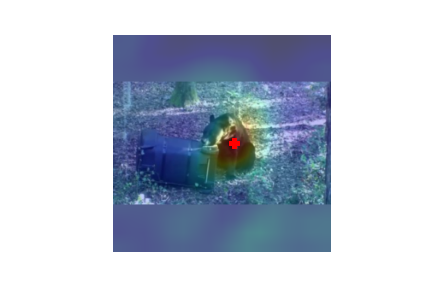
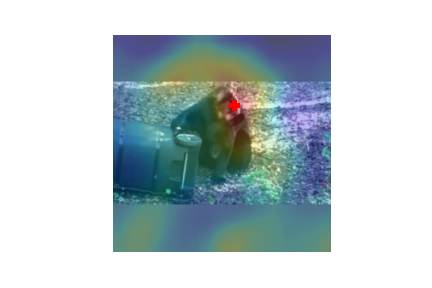

---
* **idx = 140**

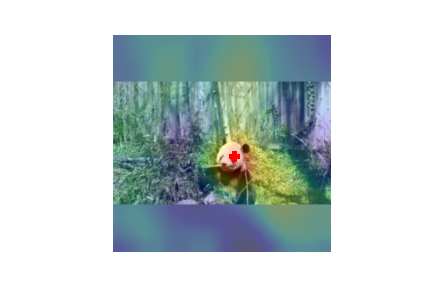
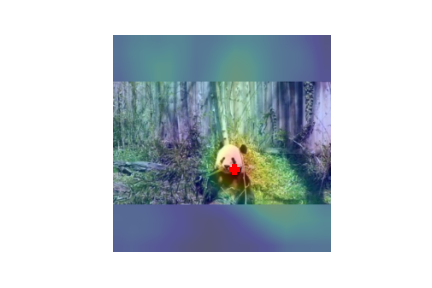

---
* **idx = 250**

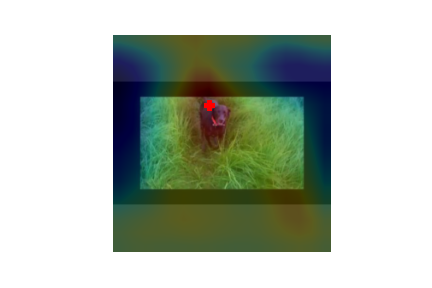
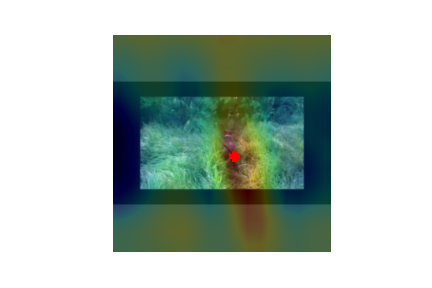

---

---
# **Tensorboard for train_loss and validation_loss**
---
---
* **Average train_loss**

  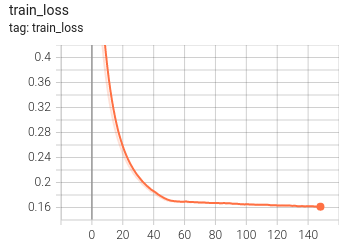

* **Average validation_loss**

  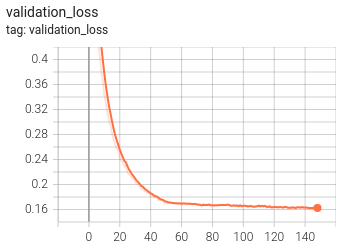

---

---
# **Discussion about the above Experiments !!**
---
---
**Provide at least 3 gifs from 3 different videos (vid_1.gif, vid_2.gif, ...) and brief analysis on them (If it's working well, discuss the key to the success. If it's not working properly, discuss the possible reasons for the failure.)**

* Video indices with good tracking results: **vid_0.gif, vid_16.gif, vid_30.gif, vid_115.gif, vid_140.gif**
  - The reasons why the tracking results of these videos are good are as follows. First of all, when comparing video frames sequentially, the movement of the object is not fast. In other words, the meaning that the movement of objects is not fast is that there is an advantage of the target can be learned without a large object's error when sequentially comparing frames. Second, all the objects of the video are contained in the frame, so target representation is possible enough for learning. In other words, since the motion of the object does not change significantly or all of the information can be stored in the bounding box, there is an advantage in that the information of the features that have passed through the CNN is enriched. Finally, it has the advantage of obtaining efficient image spatial information through correlation operation. For these reasons, good tracking results can be obtained.


* Video indices with poor tracking results: **vid_20.gif, vid_40.gif, vid_250.gif**
  - The reasons for the poor tracking results of these videos are as follows. First of all, when comparing consecutive video frames, the movement of the object is very fast. In other words, when sequential object movements are compared one after another, it is possible to learn a large error about the object. So, if the previous frame moves quickly, drift and error may occur as much as possible, and there may be a problem that the error may increase while learning them. Second, there is the problem of the appearance of objects. If you look at the movement of videos with poor tracking results, it may come close to the image and not contain all the information of the object. And as the object moves freely, there are cases where the deformation problem occurs that is significantly different from the shape of the exemplar image. For these reasons, good tracking results cannot be obtained.
  

---
**Provide your own thoughts on the limitation of this work and provide a possible direction for improvement.**

* **[SiamFC Advantages]** The network has a methodology for learning the classifier as a discriminative tracking method. The problems that occur when performing the existing visual object tracking have been resolved, and these are as follows. First of all, it was not possible to proceed with image representation using a pre-trained model because the object of the videos changes every time. However, in the feature extraction process, a CNN-based model was applied so that a pre-trained model could be applied to the target appearence. This is because the model trained with CNN learned various apperences for the target. Additionally, the parameters for the classifier were also adaptively changed. That is, the parameters are not fixed in response to the change of the input, but it is possible to learn while changing it flexibly, making it more possible to track variously deformed targets. 
Third, there is an advantage of reducing the number of parameters during training by sharing parameters while configuring the siamese network. Finally, there are advantages of learning in an end-to-end manner while changing both feature extraction and classifier to learning-based.

* **[SiamFC Disadvantages]** This network also has the following disadvantages. First of all, as mentioned earlier, there is a disadvantage that tracking is not yet robust when the moving speed of objects is fast. Also, even if the appearance of an object changes (e.g. when deformation and object size are not all included in the image size), tracking performance is not guaranteed. And since the label of the object does not exist, the loss cannot be defined, and the learning of the feature extraction part becomes difficult. It has the disadvantage that it is not easy to obtain robust results for object tracking. Actually, if you look at the 000000.json file of minidataset/Annotations/VID/val/ILSVRC2015_val_00000000, it is composed as follows.

  - ```
   {
     "bbox": {
        "xmax": 215,
        "xmin": 148,
        "ymax": 61,
        "ymin": 2
      },
      "H": 256,
      "W": 455,
      "valid": true
  }
  
* **[Possible Direction]** First, a label is added to the corresponding objects and a loss function for the label is additionally configured to enable robust tracking. And, like the attention method, we design the attention module for the localization of the corresponding object and proceed with tracking. In addition, the spatial pyramid methodology is additionally used to robustly track the scale variation and aspect ratio change. Finally, we will apply the method of accurately localizing the object by performing mask prediction on the object.


 
---